In [1]:
import requests # library to handle requests
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

!conda install -c conda-forge folium=0.5.0 --yes
import folium # plotting library

print('Folium installed')
print('Libraries imported.')
Singapore_map = folium.Map(location=[1.3521, 103.8198], zoom_start=12)

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-2.0.0                |     pyh9f0ad1d_0          63 KB  conda-forge
    ca-certificates-2020.6.20  |       hecda079_0         145 KB  conda-forge
    openssl-1.1.1g             |       h516909a_1         2.1 MB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    certifi-2020.6.20          |   py36h9f0ad1d_0         151 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0          conda-forge
    geopy:           

 # Foursquare Data first

In [2]:
radius = 20000
LIMIT = 1000 
neighborhood_latitude = 1.3521
neighborhood_longitude = 103.8198
CLIENT_ID = 'ZB0AE5FGFOZO5H04JDGEJMBKYJDBO0RD4XKXGY4WNNZAJ0ED'
CLIENT_SECRET = 'ORH2BR221VHO5HEGZA5P40QUBILC0ODYKROHREIMA5MYAPMQ'
VERSION = '20180605'

url = 'https://api.foursquare.com/v2/venues/explore?ll={},{}&client_id={}&client_secret={}&v={}&radius={}&limit={}'.format(
    neighborhood_latitude, 
    neighborhood_longitude,  
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    radius, 
    LIMIT)   
url

'https://api.foursquare.com/v2/venues/explore?ll=1.3521,103.8198&client_id=ZB0AE5FGFOZO5H04JDGEJMBKYJDBO0RD4XKXGY4WNNZAJ0ED&client_secret=ORH2BR221VHO5HEGZA5P40QUBILC0ODYKROHREIMA5MYAPMQ&v=20180605&radius=20000&limit=1000'

In [3]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5f3d261f0179823aae11eba9'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Singapore',
  'headerFullLocation': 'Singapore',
  'headerLocationGranularity': 'city',
  'totalResults': 240,
  'suggestedBounds': {'ne': {'lat': 1.5321001800001801,
    'lng': 103.99951413758708},
   'sw': {'lat': 1.17209981999982, 'lng': 103.64008586241292}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4dabe0ae8154abafc2cc0a7b',
       'name': 'MacRitchie Nature Trail',
       'location': {'address': 'MacRitchie Reservoir Park',
        'lat': 1.3473117419966827,
        'lng': 103.83141058957372,
        'labeledLatLngs': [{'label': 'display',
          'lat': 1.

In [4]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [5]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,MacRitchie Nature Trail,Trail,1.347312,103.831411
1,MacRitchie Reservoir,Reservoir,1.342698,103.833632
2,Tomyum Mama,Thai Restaurant,1.353415,103.834441
3,MacRitchie Reservoir Park,Park,1.341727,103.834281
4,Sin Ming Roti Prata (Faisal & Aziz Curry Musli...,Indian Restaurant,1.355269,103.836719


In [6]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


In [7]:
singapore_map = folium.Map(location=[neighborhood_latitude, neighborhood_longitude], zoom_start=12)

# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 100 venues and add each to the incidents feature group
for lat, lng, in zip(nearby_venues.lat, nearby_venues.lng):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
singapore_map.add_child(incidents)


In [9]:

body = client_17323c4239b14a22a149c73948753ad5.get_object(Bucket='capstonemodule9-donotdelete-pr-vozajcgug7pjdz',Key='BusStop.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_bus = pd.read_csv(body)
df_bus



,X,Y,BUS_STOP_N,BUS_ROOF_N,LOC_DESC
0,103.961167,1.374066,78221,B06,NaN
1,103.887824,1.369405,63359,B01,HOUGANG SWIM CPLX
2,103.908217,1.364686,64141,B13,AFT JLN TELAWI
3,103.909967,1.314543,83139,B07,AFT JOO CHIAT PL
4,103.848324,1.385631,55231,B02,OPP SBST EAST DISTRICT
5,103.836956,1.389785,55351,B03,OPP FUDU WALK P/G
6,103.917586,1.307178,92089,B10,CHIJ KATONG CON
7,103.882956,1.305118,80271,B06,OPP BLK 2
8,103.897498,1.301153,82059,B02,ONE AMBER
9,103.980051,1.370824,97089,B02,OPP SELARANG PK DRUG REH.


In [10]:
singapore_map = folium.Map(location=[1.3521, 103.8198], zoom_start=12)
singapore_map = folium.Map(location=[neighborhood_latitude, neighborhood_longitude], zoom_start=12)

# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 100 venues and add each to the incidents feature group
for lat, lng, in zip(df_bus.Y, df_bus.X):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=3, # define how big you want the circle markers to be
            color='orange',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
singapore_map.add_child(incidents)


In [11]:

body = client_17323c4239b14a22a149c73948753ad5.get_object(Bucket='capstonemodule9-donotdelete-pr-vozajcgug7pjdz',Key='MRTLRTStnPtt.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_MRT_loc= pd.read_csv(body)
df_MRT_loc.head()

,X,Y,OBJECTID,STN_NAME,STN_NO
0,103.903252,1.319779,1,EUNOS MRT STATION,EW7
1,103.732597,1.342353,2,CHINESE GARDEN MRT STATION,EW25
2,103.832980,1.417383,3,KHATIB MRT STATION,NS14
3,103.762165,1.425178,4,KRANJI MRT STATION,NS7
4,103.816817,1.289563,5,REDHILL MRT STATION,EW18


In [12]:
# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 100 venues and add each to the incidents feature group
for lat, lng, in zip(df_MRT_loc.Y, df_MRT_loc.X):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=3, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
singapore_map.add_child(incidents)

In [13]:


# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 100 venues and add each to the incidents feature group
for lat, lng, in zip(nearby_venues.lat, nearby_venues.lng):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
singapore_map.add_child(incidents)

# Loading of appropriate data sets

In [8]:
# The code was removed by Watson Studio for sharing.

,year,type,engine,number
0,2006,Cars,Petrol,471707
1,2006,Cars,Diesel,7
2,2006,Cars,Petrol-Electric,379
3,2006,Cars,Petrol-Electric (Plug-In),0
4,2006,Cars,Petrol-CNG,214


In [14]:

body = client_17323c4239b14a22a149c73948753ad5.get_object(Bucket='capstonemodule9-donotdelete-pr-vozajcgug7pjdz',Key='causes-of-accidents-by-severity-of-injury-sustained.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_accident_stat = pd.read_csv(body)
df_accident_stat.head()

,year,accident_classification,road_user_group,causes_of_accident,number_of_accidents
0,2012,FATAL,"Drivers, Riders or Cyclists",Failing to Keep a Proper Lookout,59
1,2012,FATAL,"Drivers, Riders or Cyclists",Failing to Have Proper Control,50
2,2012,FATAL,"Drivers, Riders or Cyclists",Failing to Give Way to Traffic with Right of Way,9
3,2012,FATAL,"Drivers, Riders or Cyclists",Changing Lane without Due Care,6
4,2012,FATAL,"Drivers, Riders or Cyclists",Disobeying Traffic Light Signals Resulting in ...,9


In [15]:

body = client_17323c4239b14a22a149c73948753ad5.get_object(Bucket='capstonemodule9-donotdelete-pr-vozajcgug7pjdz',Key='number-of-mrt-and-lrt-stations.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_station_stat = pd.read_csv(body)
df_station_stat = df_station_stat.astype(float) 
df_station_stat

,year,mrt,lrt
0,2004.0,65.0,20.0
1,2005.0,65.0,31.0
2,2006.0,66.0,31.0
3,2007.0,66.0,33.0
4,2008.0,68.0,33.0
5,2009.0,73.0,33.0
6,2010.0,84.0,33.0
7,2011.0,97.0,34.0
8,2012.0,99.0,34.0
9,2013.0,105.0,35.0


All data sets from LTA have been loaded, we will now proceed with calculation

Text(0.5, 1.0, 'Number of MRT,LRT stations from 2004 - 2017')

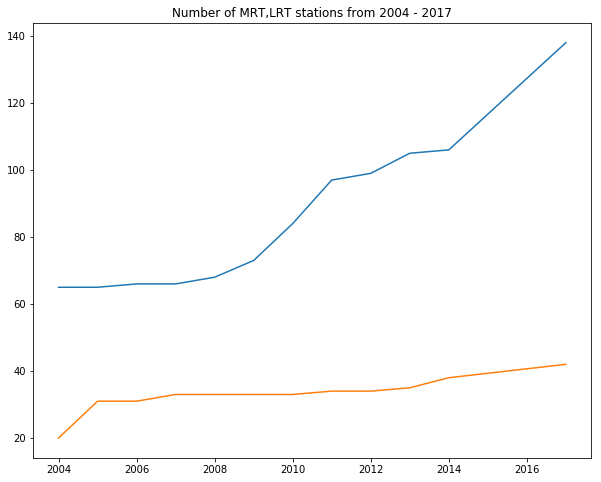

In [19]:
plt.figure(figsize=(10,8))
plt.plot(df_station_stat['year'],df_station_stat['mrt'])
plt.plot(df_station_stat['year'],df_station_stat['lrt'])
plt.title("Number of MRT,LRT stations from 2004 - 2017")

In [17]:
df_accident_collated = df_accident_stat.groupby(['year', 'accident_classification'])['number_of_accidents'].sum()
df_accident_collated = df_accident_collated.unstack(level=0)
print("Collated number of accidents from all causes sorted by severity")
df_accident_collated = df_accident_collated.transpose()
percentage = (df_accident_collated['FATAL'] / (df_accident_collated['FATAL']+df_accident_collated['INJURY']))*100
df_accident_collated['percentage'] = percentage
df_accident_collated

Collated number of accidents from all causes sorted by severity


accident_classification,FATAL,INJURY,percentage
year,,,
2012,231,7335,3.053132
2013,207,6793,2.957143
2014,170,7157,2.320186
2015,162,7019,2.255953
2016,140,6480,2.114804
2017,109,5101,2.092131
2018,110,4946,2.175633


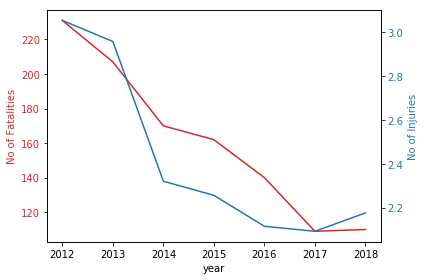

In [18]:
import matplotlib.pyplot as plt


fig, ax1 = plt.subplots()
ax1.figsize=(10,8)
color = 'tab:red'
ax1.set_xlabel('year')
ax1.set_ylabel('No of Fatalities', color=color)
ax1.plot(df_accident_collated['FATAL'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('No of Injuries', color=color)  # we already handled the x-label with ax1
ax2.plot(df_accident_collated['percentage'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [20]:
df_vehicle_pop.drop(df_vehicle_pop[df_vehicle_pop.year < 2012].index, inplace=True)

In [21]:

df_vehicle_collated = df_vehicle_pop.groupby(['year', 'type'])['number'].sum()
df_vehicle_collated = df_vehicle_collated.unstack(level=0)
print("Collated number of vehicles sorted by year")
df_vehicle_collated = df_vehicle_collated.transpose()
sum_total = df_vehicle_collated['Buses']+df_vehicle_collated['Cars']+df_vehicle_collated['Goods and Other Vehicles']+df_vehicle_collated['Motorcycles']+df_vehicle_collated['Taxis']
df_vehicle_collated['sum_total'] = sum_total
df_vehicle_collated

Collated number of vehicles sorted by year


type,Buses,Cars,Goods and Other Vehicles,Motorcycles,Taxis,sum_total
year,,,,,,
2012,16768,617570,145046,143286,28210,950880
2013,17065,621345,144202,144307,27695,954614
2014,17109,616609,144507,144404,28736,951365
2015,17740,602311,143972,143279,28259,935561
2016,18338,601257,143966,142439,27534,933534
2017,18814,612256,142857,141304,23140,938371
2018,18947,615452,141408,136842,20581,933230


Initial observation- from 2014 to 2017, there is an overall reduction in the number of vehicles in all types except for buses. 
The number of recorded accidents too has also reduced for both categories (fatal and injury)


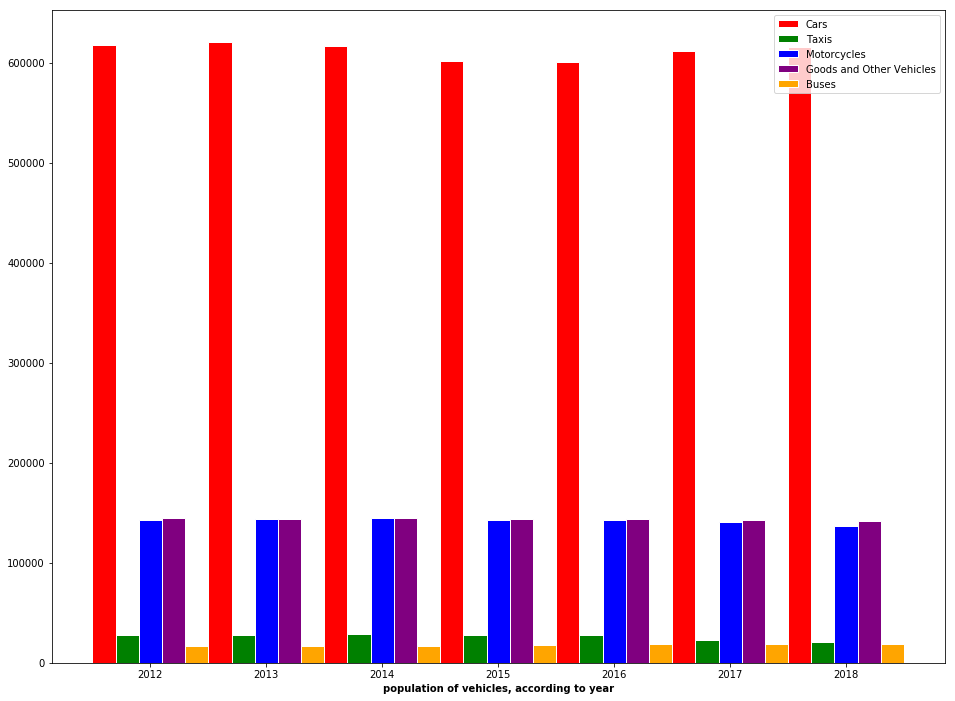

In [22]:
barWidth = 0.2
r1 = np.arange(len(df_vehicle_collated['Cars']))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]

plt.figure(figsize=(16,12))
plt.bar(r1, df_vehicle_collated['Cars'], color='red', width=barWidth, edgecolor='white', label='Cars')
plt.bar(r2, df_vehicle_collated['Taxis'], color='green', width=barWidth, edgecolor='white', label='Taxis')
plt.bar(r3, df_vehicle_collated['Motorcycles'], color='blue', width=barWidth, edgecolor='white', label='Motorcycles')
plt.bar(r4, df_vehicle_collated['Goods and Other Vehicles'], color='purple', width=barWidth, edgecolor='white', label='Goods and Other Vehicles')
plt.bar(r5, df_vehicle_collated['Buses'], color='orange', width=barWidth, edgecolor='white', label='Buses')
 
# Add xticks on the middle of the group bars
plt.xlabel('population of vehicles, according to year', fontweight='bold')
plt.xticks([r + 2 *barWidth for r in range(len(df_vehicle_collated['Cars']))], ['2012', '2013', '2014', '2015', '2016','2017', '2018'])
 
# Create legend & Show graphic
plt.legend()
plt.show()

we have derived the accident rate for each vehicle for the 2 years before and after the downtown line was constructed. overall the accident fatal accident rate has dropped from 0.000179 to 0.000116/vehicle (170 vs 109 recorded fatal accidents) and 0.007523 to   0.005436/vehicle (7157 vs 5101 recorded accidents that resulted in injury). In the same period, 

In [24]:
accident_injury = 100 * df_accident_collated['INJURY'] / df_vehicle_collated['sum_total'] 
accident_fatal = 100 * df_accident_collated['FATAL'] / df_vehicle_collated['sum_total']



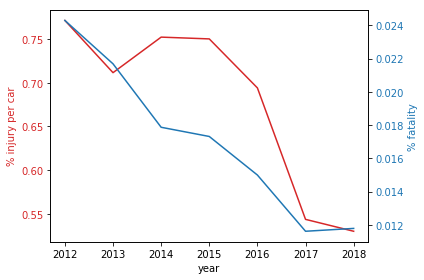

In [25]:
fig, ax1 = plt.subplots()
ax1.figsize=(10,8)
color = 'tab:red'
ax1.set_xlabel('year')
ax1.set_ylabel('% injury per car', color=color)
ax1.plot(accident_injury, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('% fatality', color=color)  # we already handled the x-label with ax1
ax2.plot(accident_fatal, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [23]:
df_station_stat.drop(df_station_stat[df_station_stat.year < 2012].index, inplace=True)
df_station_stat

,year,mrt,lrt
8,2012.0,99.0,34.0
9,2013.0,105.0,35.0
10,2014.0,106.0,38.0
11,2017.0,138.0,42.0


Thomson-East coast line in phase 2 will add an additional new 16 stations. Another existing 6 stations will be interchanges, which will not be included as new stations

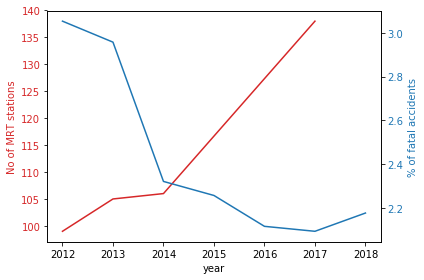

In [26]:
fig, ax1 = plt.subplots()
ax1.figsize=(10,8)
color = 'tab:red'
ax1.set_xlabel('year')
ax1.set_ylabel('No of MRT stations', color=color)
ax1.plot(df_station_stat['year'],df_station_stat['mrt'], color = color)
ax1.tick_params(axis='y', labelcolor=color)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_xlabel('year')
ax2.set_ylabel('% of fatal accidents', color=color)
ax2.plot(df_accident_collated['percentage'], color = color)
ax2.tick_params(axis='y', labelcolor=color)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

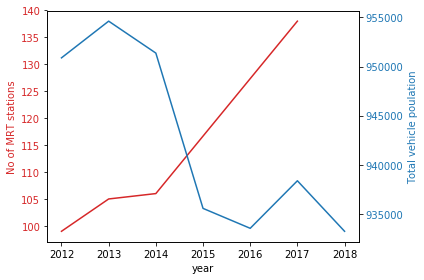

In [27]:
fig, ax1 = plt.subplots()
ax1.figsize=(10,8)
color = 'tab:red'
ax1.set_xlabel('year')
ax1.set_ylabel('No of MRT stations', color=color)
ax1.plot(df_station_stat['year'],df_station_stat['mrt'], color = color)
ax1.tick_params(axis='y', labelcolor=color)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_xlabel('year')
ax2.set_ylabel('Total vehicle poulation', color=color)
ax2.plot(df_vehicle_collated['sum_total'], color = color)
ax2.tick_params(axis='y', labelcolor=color)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [31]:

body = client_17323c4239b14a22a149c73948753ad5.get_object(Bucket='capstonemodule9-donotdelete-pr-vozajcgug7pjdz',Key='annual_public_transport_capacity-KM-travelled.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_distance_travelled = pd.read_csv(body)
df_distance_travelled.head()


,year,mrt,bus
0,2004,40700,819400
1,2005,41400,822200
2,2006,41200,833000
3,2007,42200,844200
4,2008,45200,826800


In [33]:
df_distance_travelled.drop(df_distance_travelled[df_distance_travelled.year < 2012].index, inplace=True)
df_distance_travelled

,year,mrt,bus
8,2012,72400,817500
9,2013,72400,856600
10,2014,77200,901700


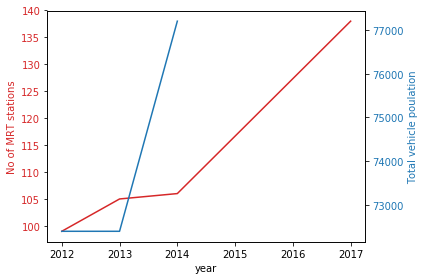

In [39]:
fig, ax1 = plt.subplots()
ax1.figsize=(10,8)
color = 'tab:red'
ax1.set_xlabel('year')
ax1.set_ylabel('No of MRT stations', color=color)
ax1.plot(df_station_stat['year'],df_station_stat['mrt'], color = color)
ax1.tick_params(axis='y', labelcolor=color)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_xlabel('year')
ax2.set_ylabel('Total Distance travelled by train', color=color)
ax2.plot(df_distance_travelled['year'],df_distance_travelled['mrt'], color = color)
ax2.tick_params(axis='y', labelcolor=color)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [66]:

body = client_17323c4239b14a22a149c73948753ad5.get_object(Bucket='capstonemodule9-donotdelete-pr-vozajcgug7pjdz',Key='yearly_ave_daily_pt_ridership.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_total_ridership = pd.read_csv(body)
df_total_ridership.head()


,year,type_of_public_transport,average_ridership
0,1995,MRT,740000
1,1995,LRT,0
2,1995,Bus,3009000
3,1995,Taxi,0
4,1996,MRT,850000


In [67]:
df_total_ridership.drop(df_total_ridership[df_total_ridership.year< 2012].index, inplace=True)
df_total_ridership

,year,type_of_public_transport,average_ridership
68,2012,MRT,2525000
69,2012,LRT,124000
70,2012,Bus,3481000
71,2012,Taxi,967000
72,2013,MRT,2623000
73,2013,LRT,132000
74,2013,Bus,3601000
75,2013,Taxi,967000
76,2014,MRT,2762000
77,2014,LRT,137000


In [68]:
df_total_ridership = df_total_ridership.groupby(['year'])['average_ridership'].sum()
df_total_ridership

year
2012    7097000
2013    7323000
2014    7670000
2015    7933000
2016    8168000
Name: average_ridership, dtype: int64

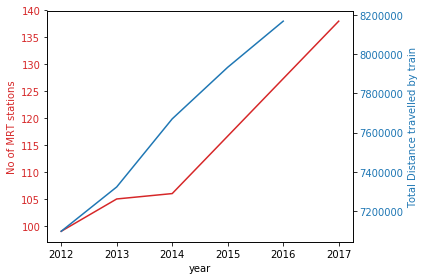

In [69]:
fig, ax1 = plt.subplots()
ax1.figsize=(10,8)
color = 'tab:red'
ax1.set_xlabel('year')
ax1.set_ylabel('No of MRT stations', color=color)
ax1.plot(df_station_stat['year'],df_station_stat['mrt'], color = color)
ax1.tick_params(axis='y', labelcolor=color)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_xlabel('year')
ax2.set_ylabel('Total Ridership', color=color)
ax2.plot(df_total_ridership, color = color)
ax2.tick_params(axis='y', labelcolor=color)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()